# DATA LOADING AND PROCESSING TUTORIAL

+ __scikit-image__: For image __io__ and __transform__
+ __pandas__: For easier 
+ __warnings.filterwarnings("ignore")__ ignores the warnings
+ __plt.ion()__ interactive mode
+ __pd.Dataframe.iloc[]__: Pureley integer-loaction based indexing for selection by positon.
+ __pd.Dataframe.as_matrix()__ change the dataframe into matrix with rows equal to the __Series__ and columns equal to __fields of Series__
+ __np.array.astype()__ can be used to change the type of the elements of the array


In [2]:
%matplotlib notebook
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

import warnings
warnings.filterwarnings("ignore")
plt.ion()

In [3]:
landmarks_frame = pd.read_csv('data/faces/face_landmarks.csv')

n = 65
img_name = landmarks_frame.iloc[n,0]
landmarks = landmarks_frame.iloc[n,1:].as_matrix()
landmarks = landmarks.astype('float').reshape(-1,2)

print('Image name: %s'%img_name)
print('Landmarks shape: {}'.format(landmarks.shape))
print('First 4 Landmarks: {}'.format(landmarks[:4]))

Image name: person-7.jpg
Landmarks shape: (68, 2)
First 4 Landmarks: [[32. 65.]
 [33. 76.]
 [34. 86.]
 [34. 97.]]


### Helper function to show an image and its landmarks

In [4]:
def show_landmarks(image, landmarks):
    plt.imshow(image)
    plt.scatter(landmarks[:,0], landmarks[:,1], c='r', s=10, marker='.')
    plt.pause(0.001)
plt.figure()
show_landmarks(io.imread(os.path.join('data/faces/', img_name)),
              landmarks)
plt.show()

<IPython.core.display.Javascript object>

### Dataset Class
+ __torch.utils.data.Dataset__ 
    + It is an abstract class representing a dataset. 
    + Custom dataset should inherit __Dataset__ and override the following functions.
        + __\_\_len\_\___ so that len(dataset) returns the size of the dataset
        + __\_\_getitem\_\___ to support the indexing such that dataset[i] can be used to get the $i^{th}$ sample
    + define transform inside the __\_\_init\_\_()__ function
    + load image in __\_\_getitem()\_\_()__ function
    + class with __\_\_len\_\_()__ and __\_\_getitem\_\_()__ can be changed to iterator

In [1]:
class FaceLandmarksDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.landmarks_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
    
    def __len__(self):
        return len(self.landmarks_frame)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.landmarks_frame.iloc[idx,0])
        image = io.imread(img_name)
        landmarks = self.landmarks_frame.iloc[idx,1:].as_matrix()
        landmarks = landmarks.astype('float').reshape(-1,2)
        sample = {'image': image, 'landmarks': landmarks}
        
        if self.transform:
            sample = self.transform(sample)
        return sample


NameError: name 'Dataset' is not defined

In [6]:
face_dataset = FaceLandmarksDataset(csv_file='data/faces/face_landmarks.csv',
                                   root_dir='data/faces/')
fig = plt.figure()
for i in range(len(face_dataset)):
    sample = face_dataset[i]
    print(i, sample['image'].shape, sample['landmarks'].shape)
    ax = plt.subplot(1,4, i+1)
    plt.tight_layout()
    ax.set_title('Sample #{}'.format(i))
    ax.axis('off')
#     print(sample)
    show_landmarks(**sample)
    
    if i == 3:
        plt.show()
        break

<IPython.core.display.Javascript object>

0 (324, 215, 3) (68, 2)
1 (500, 333, 3) (68, 2)
2 (250, 258, 3) (68, 2)
3 (434, 290, 3) (68, 2)


In [8]:
list(iter(face_dataset))[0]['image'].shape

(324, 215, 3)

# Transforms

In [28]:
class Rescale(object):
    def __init__(self, output_size):
        assert isinstance(output_size, (int, tuple))
        self.output_size = output_size
    
    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']
        h,w = image.shape[:2]
        if isinstance(self.output_size, int):
            if h > w:
                new_h, new_w = self.output_size * h / w, self.output_size
            else:
                new_h, new_w = self.output_size, self.output_size * w / h
        else:
            new_h, new_w = self.output_size
        new_h, new_w = int(new_h), int(new_w)
        img = transform.resize(image, (new_h, new_w))
        landmarks = landmarks *[new_w/w, new_h/h]
        return {'image': img, 'landmarks': landmarks}

class RandomCrop(object):
    def __init__(self, output_size):
        assert isinstance(output_size, (int,tuple))
        if isinstance(output_size, int):
            self.output_size = (output_size, output_size)
        else:
            assert len(output_size) == 2
            self.output_size = output_size
    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']
        h,w = image.shape[:2]
        new_h, new_w = self.output_size
        
        top = np.random.randint(0, h-new_h)
        left = np.random.randint(0, w-new_w)
        
        image = image[top: top + new_h,
                     left: left + new_w]
        landmarks = landmarks -[left, top]
        return {'image': image, 'landmarks': landmarks}

class ToTensor(object):
    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']
        image = image.transpose((2,0,1))
        return {'image': torch.from_numpy(image), 'landmarks': torch.from_numpy(landmarks)}            
    

### Compose transforms

+ We can use __torchvision.transforms.Compose()__ function to compose the transforms 
+ __plt.tight_layout()__ automatically adjust subplot parameters to give specified padding

<IPython.core.display.Javascript object>


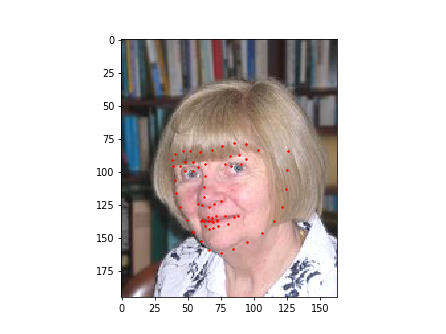

<IPython.core.display.Javascript object>


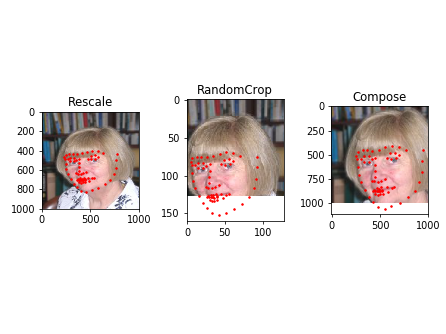

In [29]:
scale = Rescale((1000,1000))
crop = RandomCrop(128)
composed = transforms.Compose([crop,
                              scale])


fig = plt.figure()
sample = face_dataset[63]
show_landmarks(**sample)
fig = plt.figure()
for i, tsfrm in enumerate([scale, crop, composed]):
    transformed_sample = tsfrm(sample)
    ax = plt.subplot(1, 3, i+1)
    plt.tight_layout()
    ax.set_title(type(tsfrm).__name__)
    show_landmarks(**transformed_sample)
    

### Iterating through the dataset

<IPython.core.display.Javascript object>


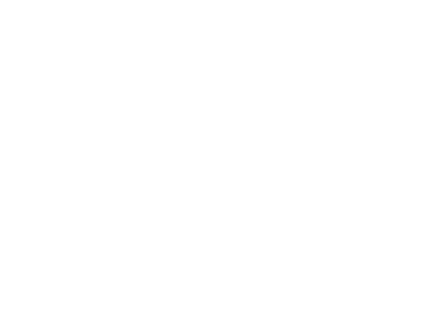

0 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


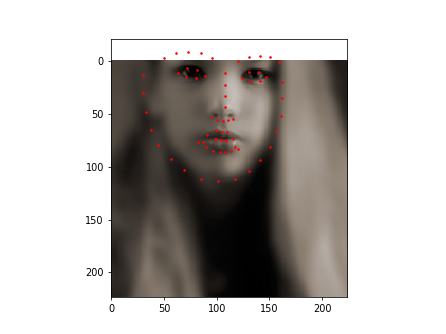

1 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


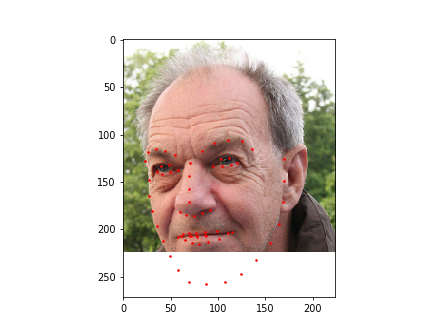

2 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


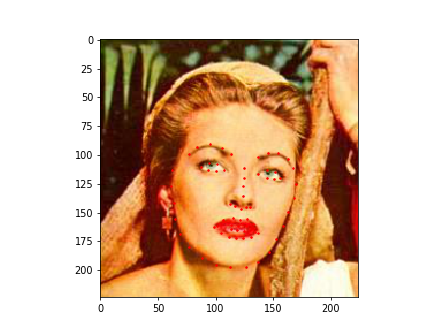

3 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


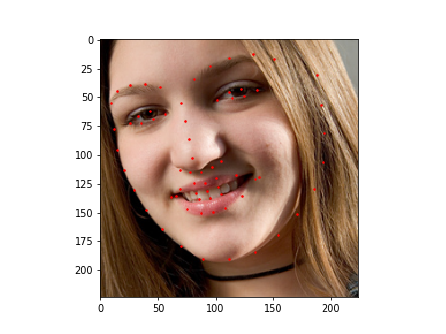

4 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


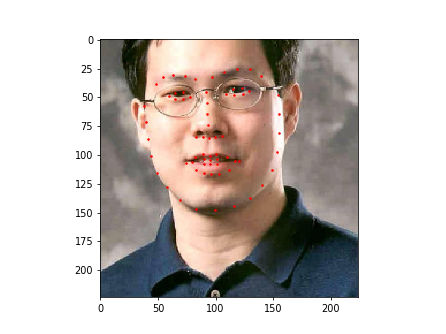

5 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


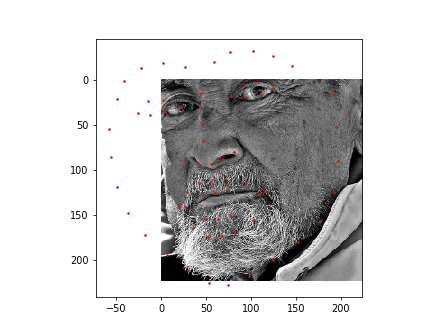

6 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


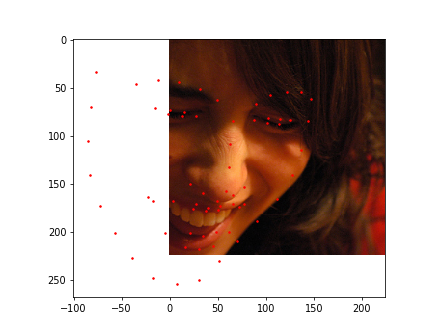

7 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


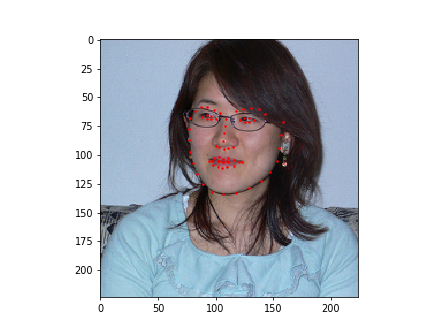

8 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


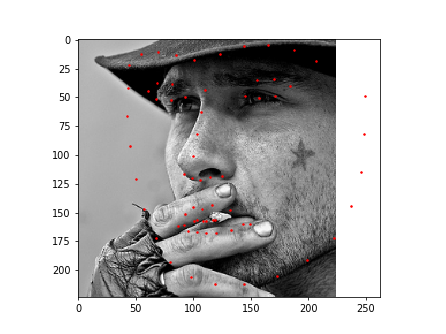

9 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


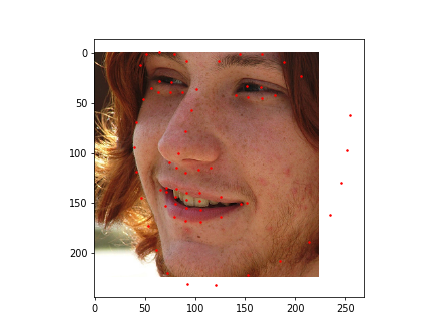

10 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


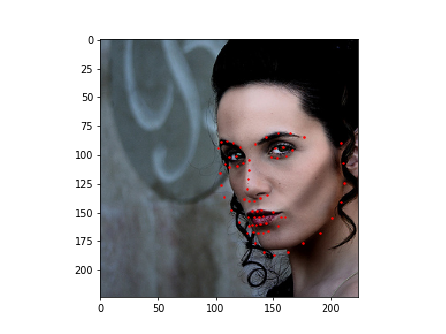

11 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


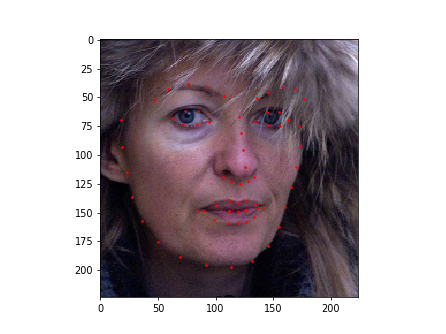

12 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


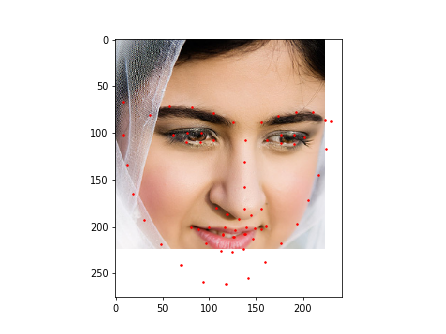

13 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


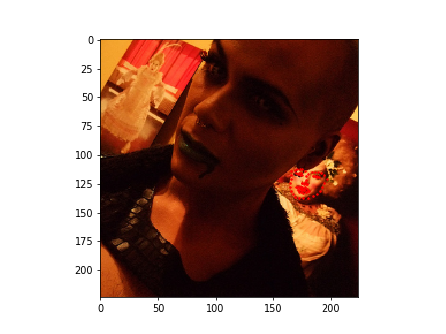

14 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


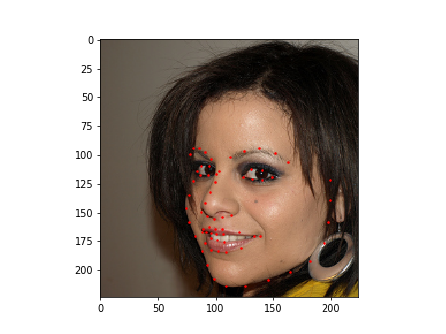

15 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


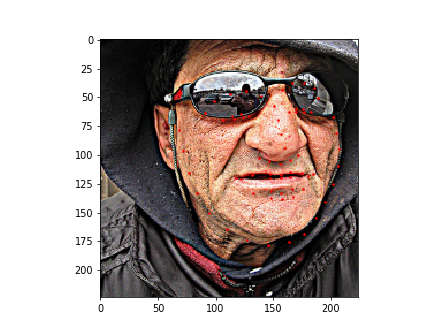

16 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


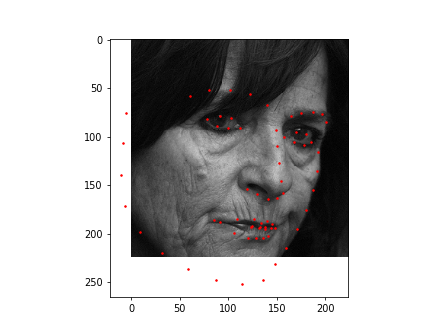

17 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


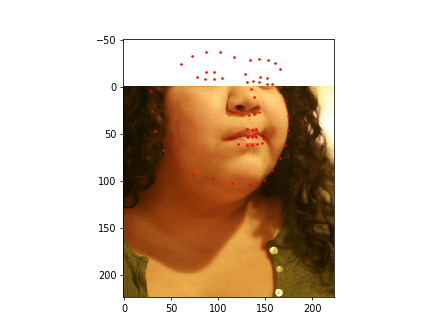

18 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


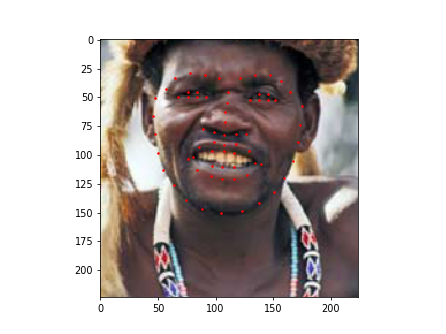

19 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


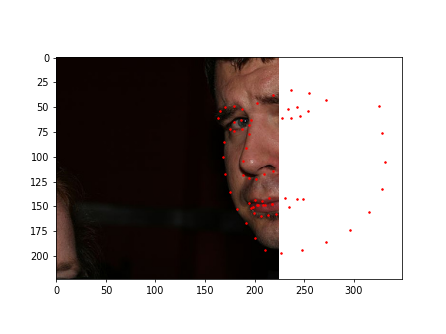

20 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


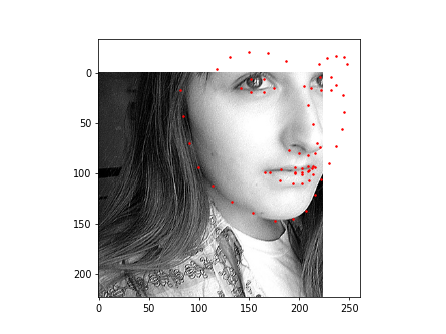

21 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


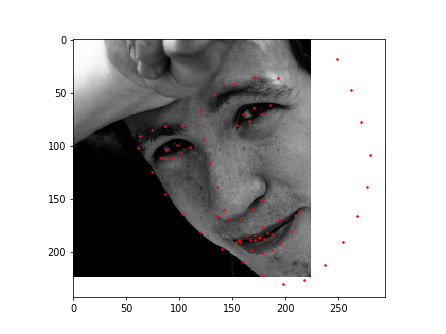

22 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


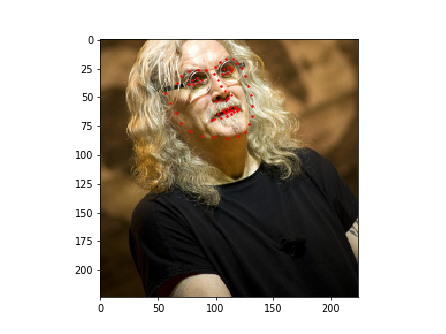

23 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


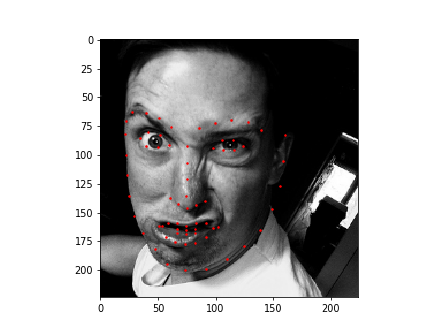

24 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


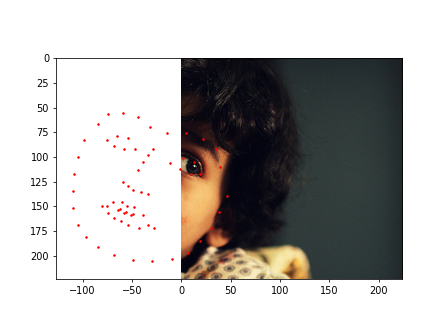

25 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


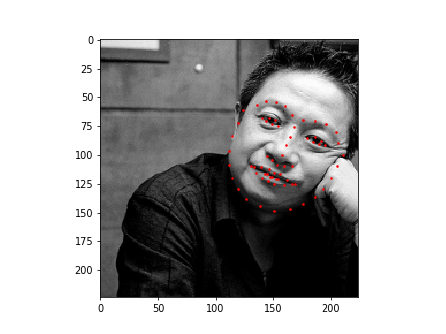

26 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


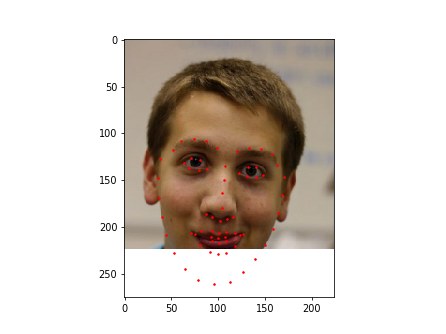

27 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


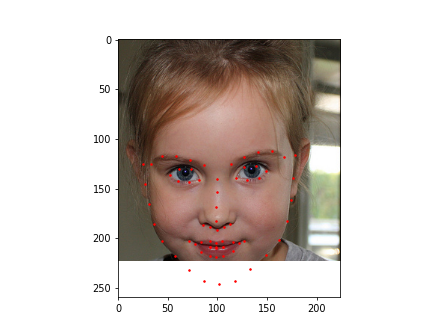

28 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


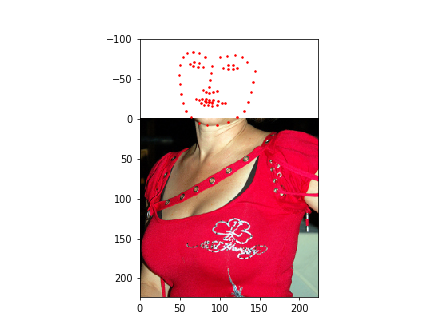

29 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


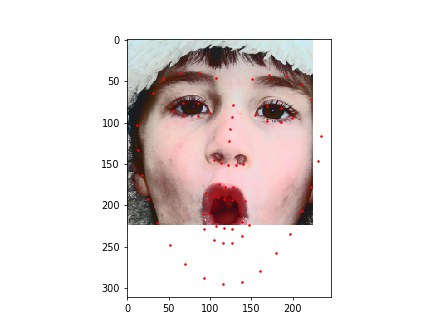

30 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


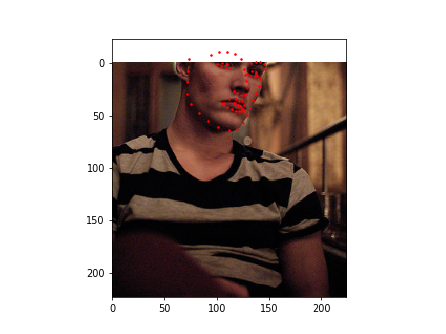

31 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


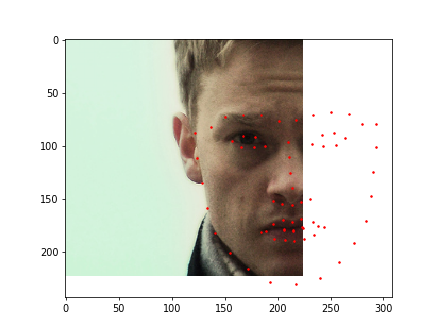

32 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


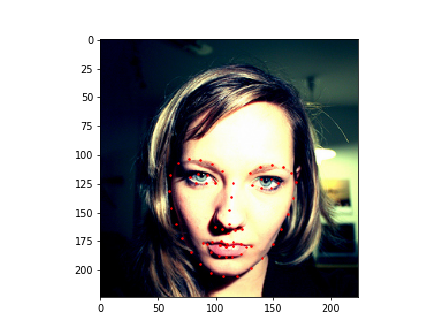

33 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


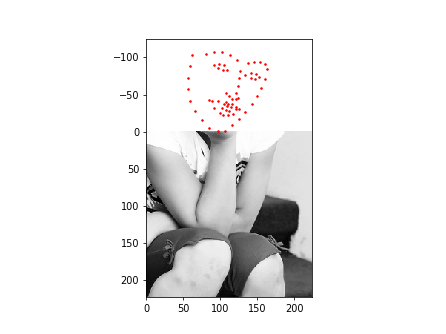

34 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

35 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

36 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

37 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

38 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


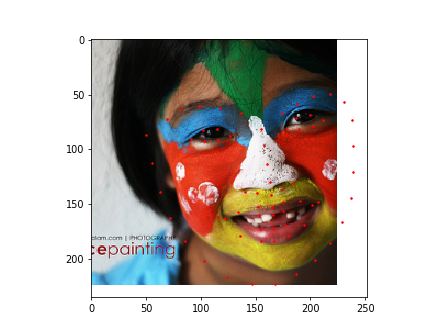

39 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


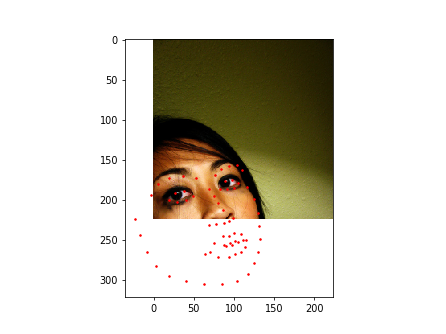

40 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


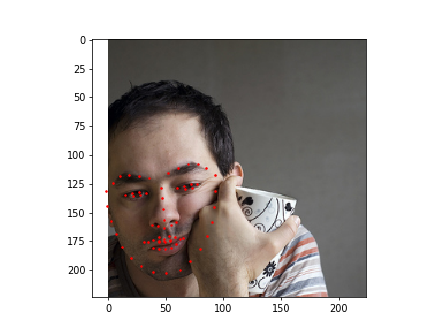

41 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


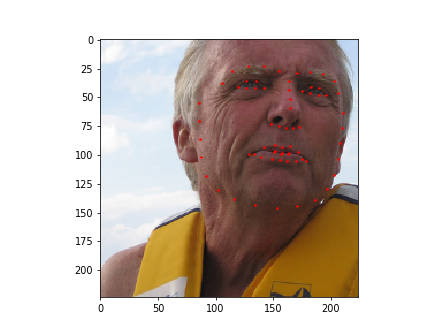

42 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


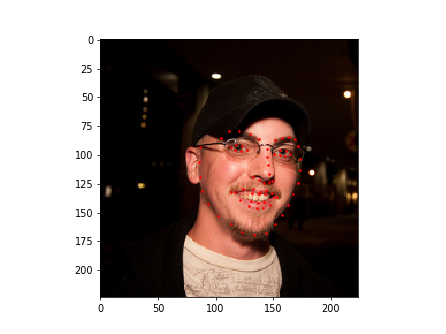

43 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


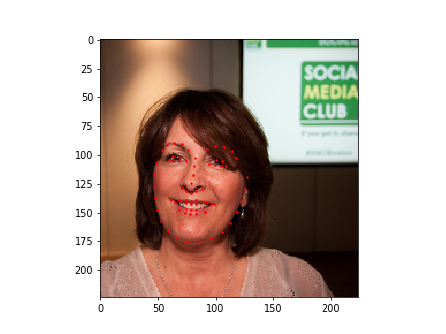

44 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


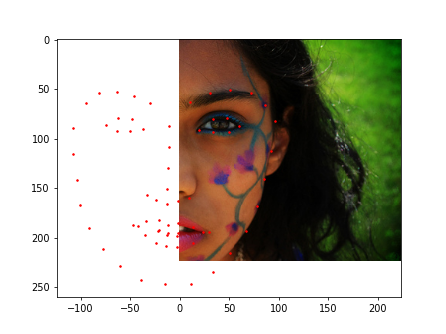

45 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

46 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


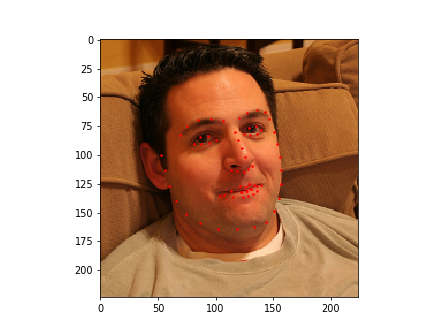

47 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


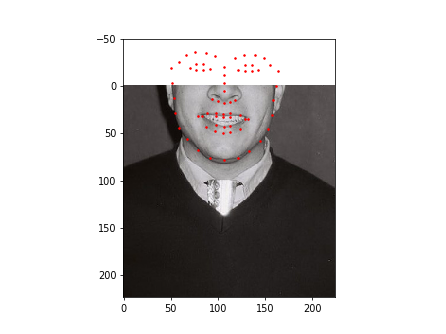

48 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


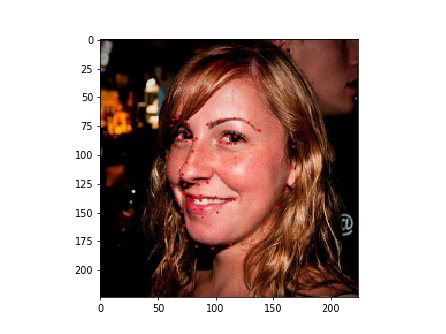

49 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

50 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


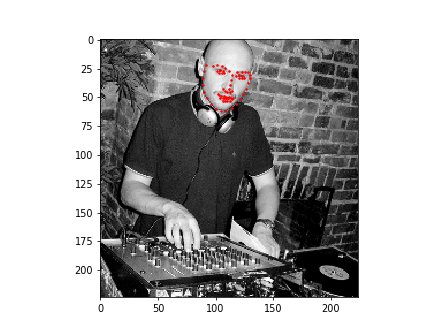

51 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


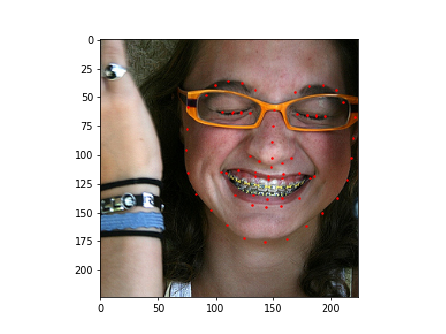

52 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


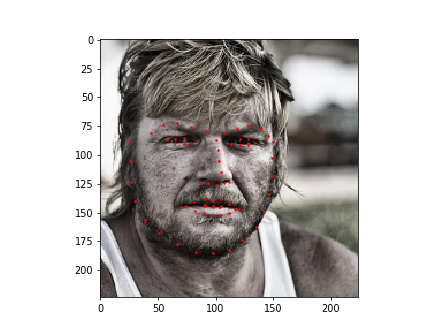

53 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


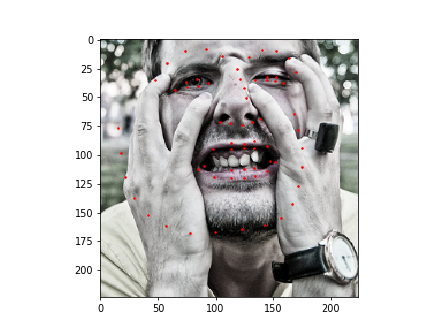

54 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


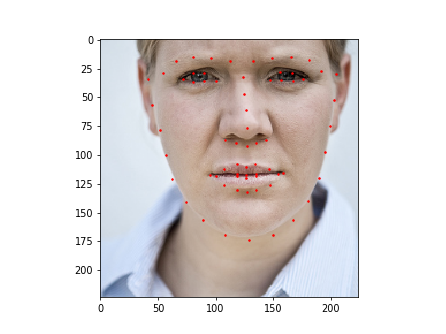

55 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


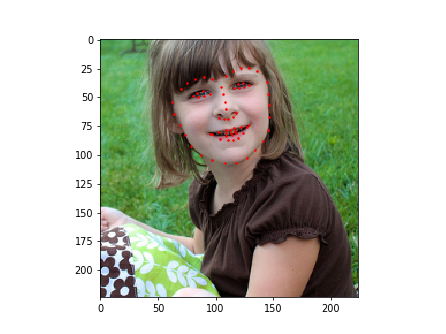

56 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


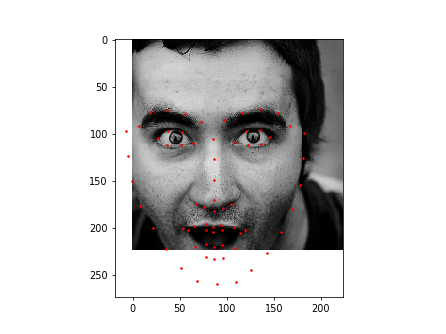

57 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


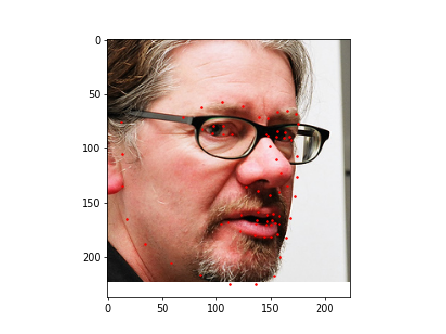

58 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


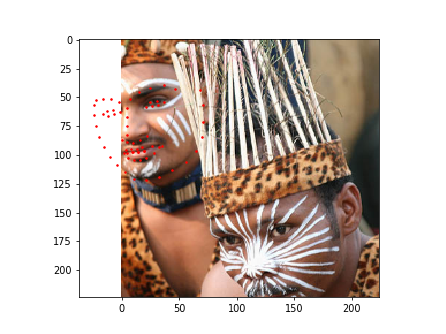

59 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

60 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

61 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

62 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

63 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

64 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

65 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>

66 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


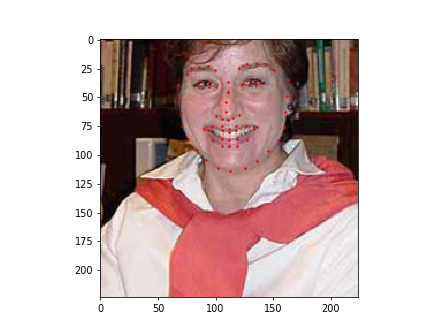

67 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


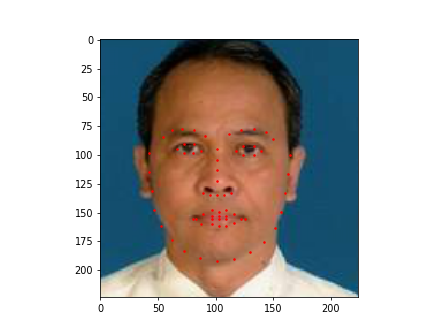

68 torch.Size([3, 224, 224]) torch.Size([68, 2])


<IPython.core.display.Javascript object>


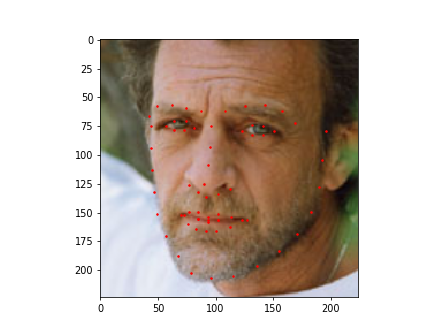

In [39]:
transformed_dataset = FaceLandmarksDataset(csv_file='data/faces/face_landmarks.csv',
                                          root_dir = 'data/faces/',
                                          transform=transforms.Compose([
                                              Rescale(256),
                                              RandomCrop(224),
                                              ToTensor()
                                          ]))
plt.figure()
for i in range(len(transformed_dataset)):
    sample = transformed_dataset[i]
    
    print(i, sample['image'].size(), sample['landmarks'].size())
    plt.figure()
    show_landmarks(sample['image'].numpy().transpose((1,2,0)), sample['landmarks'])
    

+ DataLoader batch provides dictionary with elements list of images and list of landmarks i.e __$N*C*H*W and N*N_Landmarks*2$__

0 torch.Size([4, 3, 224, 224]) torch.Size([4, 68, 2])
1 torch.Size([4, 3, 224, 224]) torch.Size([4, 68, 2])
2 torch.Size([4, 3, 224, 224]) torch.Size([4, 68, 2])
3 torch.Size([4, 3, 224, 224]) torch.Size([4, 68, 2])


<IPython.core.display.Javascript object>


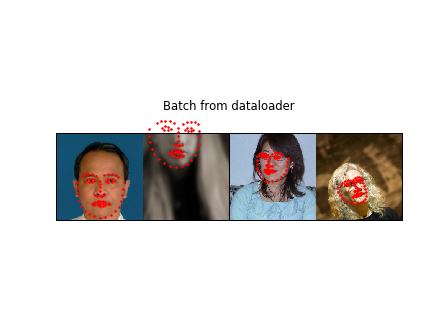

In [40]:
dataloader = DataLoader(transformed_dataset,
                        batch_size=4,
                        shuffle=True,
                        num_workers=4
                       )
def show_landmarks_batch(sample_batched):
    images_batch, landmarks_batch = sample_batched['image'], sample_batched['landmarks']
    batch_size = len(images_batch)
    im_size = images_batch.size(2)
    
    grid = utils.make_grid(images_batch)
    plt.imshow(grid.numpy().transpose((1,2,0)))
    
    for i in range(batch_size):
        plt.scatter(landmarks_batch[i,:,0].numpy()+i*im_size,
                   landmarks_batch[i,:,1].numpy(),
                   s=10, marker='.', c= 'r')
        plt.title('Batch from dataloader')
    
for i_batch, sample_batched in enumerate(dataloader):
    print(i_batch, sample_batched['image'].size(),
         sample_batched['landmarks'].size())

    if i_batch == 3:
        plt.figure()
        show_landmarks_batch(sample_batched)
        plt.axis('off')
        plt.ioff()
        plt.show()
        break
    